# 基础地图

In [1]:
import folium

In [2]:
base_map = folium.Map([22.66667,114.05667],
               tiles='https://server.arcgisonline.com/ArcGIS/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}',
               attr='Tiles &copy; Esri &mdash; Esri, DeLorme, NAVTEQ',
               zoom_start=10.5,
               control_scale=False,
               height = '85%',
               weight = '90%'
              )
base_map



In [130]:
import json
fname = "data/Shenzhen.json" 
with open(fname, encoding='utf-8') as data_file:    
    sz_data = json.load(data_file)

folium.GeoJson(
    sz_data,
    style_function=lambda feature: {
        'fillColor': '#707070',  # 选择一个颜色来突出显示深圳的区域
        'color': '#505050',  # 边界颜色
        'weight': 1,  # 边界宽度
        'dashArray': '5, 5'
    }
).add_to(base_map)
base_map

In [47]:
# 添加活动点
import pandas as pd

stay = pd.read_csv('data/stay_sample.csv')
stay.rename(columns={'chinese':'lon','math':'lat'},inplace=True)
stay['lon'] = stay['lon']*10-5
stay['lat'] = stay['lat']*10-5
stay.head()

,who,poi_id,date,s_hour,e_hour,yearmonth,lon,lat,stay_dur,fnid
0,10560,10,20191227,20,20,20191201,113.936540,22.583647,60,21853
1,10560,3,20180530,19,19,20180501,113.875428,22.588532,0,22542
2,10560,8,20190524,9,11,20190501,114.119178,22.606191,6373,25498
3,10560,0,20200512,12,23,20200501,114.114878,22.547967,37945,16214
4,10560,0,20200511,15,17,20200501,114.114878,22.547967,8363,16214


In [131]:
# Instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# Loop through the 200 crimes and add each to the incidents feature group
for lat, lng in zip(stay.lat, stay.lon):
    incidents.add_child(
        folium.CircleMarker(
            [lat, lng],
            radius=4.5, # define how big you want the circle markers to be
            color='white',
            fill=True,
            fill_color='#3366FF',
            fill_opacity=0.6,
            weight=1
            
        )
    )

# Add incidents to map
base_map.add_child(incidents)

# 三维折线图

In [1]:
import pandas as pd
import numpy as np

In [311]:
# walk dist select
walk_data = pd.read_csv("D:/317研究组/4 居住自选择/data/final_data/filled_data.csv")[['who','T','move_time','walk_dist']]

In [312]:
# 统计每个who的walk_dist不为0的数量
dist_count = walk_data['walk_dist'].groupby(walk_data['who']).agg(lambda x: (x!=0).sum()).reset_index()
# 排序
dist_count = dist_count.sort_values(by='walk_dist',ascending=False)
dist_count

,who,walk_dist
3747,37098204.0,238
7605,74917804.0,209
5150,51240906.0,204
619,6214717.0,197
4155,41255742.0,194
...,...,...
4114,40861951.0,0
4992,49886191.0,0
1878,19288445.0,0
7086,70246192.0,0


In [313]:
# 在walk_data中选择前50个who
import numpy as np
select_samples = dist_count.iloc[0:100,0].values
walk_data_select = walk_data[walk_data['who'].isin(select_samples)]

new_ids = np.repeat(range(1,101),365)
walk_data_select['id'] = new_ids

C:\Users\huangnx\AppData\Local\Temp\ipykernel_72036\3180879799.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  walk_data_select['id'] = new_ids


In [2]:
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt

C:\Users\huangnx\AppData\Local\Temp\ipykernel_72036\1394010068.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  walk_data_select['walk_dist_km'] = walk_data_select['walk_dist']/1000


Text(0.5, 0, 'Walk Distance (km)')

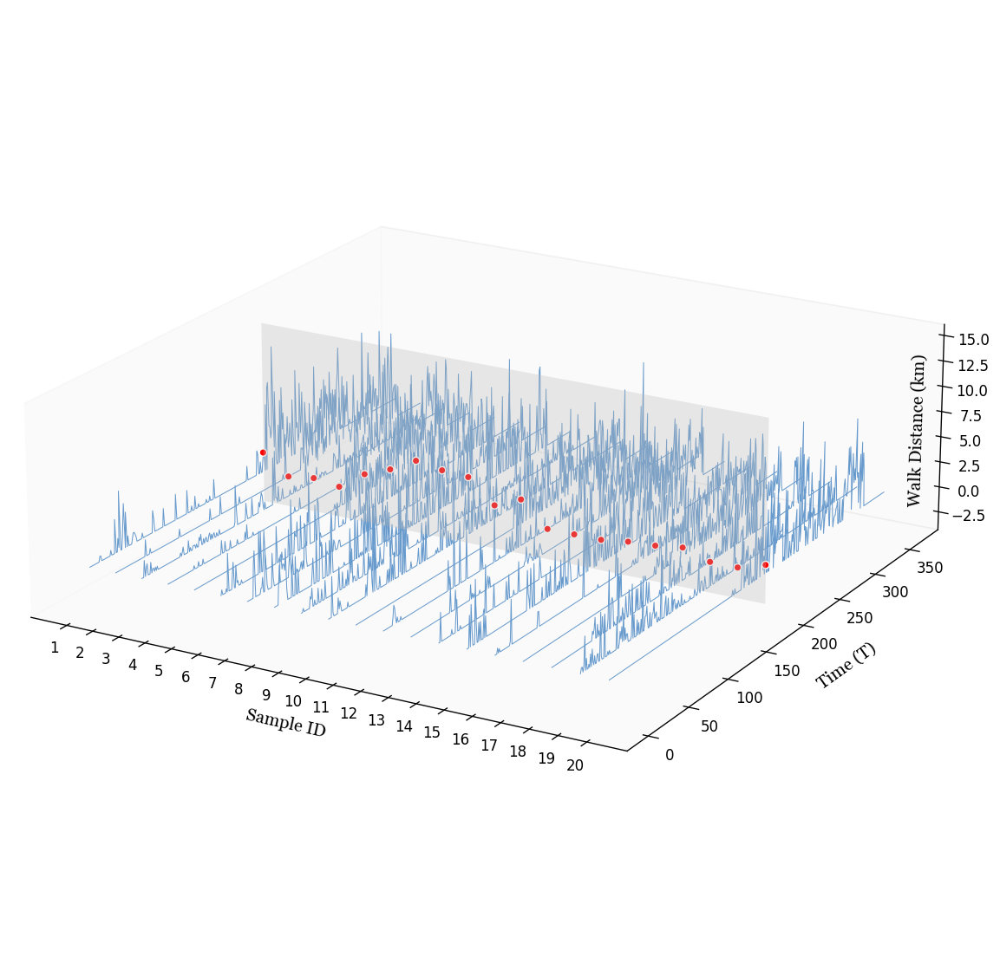

In [114]:
fig = plt.figure(figsize=(20, 12), dpi=120)
ax = plt.axes(projection='3d')

# # 设置每个平面的背景颜色
ax.xaxis.pane.fill = True
ax.yaxis.pane.fill = True
ax.zaxis.pane.fill = True
light_gray = (0.97, 0.97, 0.97, 1.0) # 极淡的灰色
ax.xaxis.pane.set_facecolor(light_gray) # 设置X平面的颜色
ax.yaxis.pane.set_facecolor(light_gray) # 设置Y平面的颜色
ax.zaxis.pane.set_facecolor(light_gray) # 设置Z平面的颜色

walk_data_select['walk_dist_km'] = walk_data_select['walk_dist']/1000
for sample_id in walk_data_select['id'].unique():
    sample_data = walk_data_select[walk_data_select['id'] == sample_id]
    xline = sample_data['id']
    yline = sample_data['T']
    zline = sample_data['walk_dist_km']

    ax.plot3D(xline, yline, zline, linewidth=0.6, color='#6699cc')

# 绘制一个垂直面（Y=某个常数）
y_loc = 200; n_samples = 20
X = np.linspace(min(walk_data_select['id']), max(walk_data_select['id']), n_samples)
Z = np.linspace(min(walk_data_select['walk_dist_km'])-3, max(walk_data_select['walk_dist_km']), n_samples)
X, Z = np.meshgrid(X, Z)
Y = np.full_like(X, y_loc)  # 150是X的一个常数值
ax.plot_surface(X, Y, Z, alpha=0.3, rstride=100, cstride=100, color='#D0D0D0')

# 添加平面上的点
point_insurface = walk_data_select[walk_data_select['T'] == y_loc]
ax.scatter3D(point_insurface['id'], point_insurface['T']-0.5, point_insurface['walk_dist_km'], c='red', edgecolors='white', linewidth=0.8, s=25, alpha=1)

# 设置轴的宽高比，以拉宽X轴
ax.set_box_aspect([3, 3, 1])
ax.view_init(elev=20)  # elev是仰角, azim是方位角
ax.grid(False)
# 设置轴标签
font_properties = {'family': 'Georgia', 'size': 12}
ax.set_xlabel('Sample ID', labelpad=10, fontdict=font_properties)
ax.set_xticks(range(1,21))
ax.set_ylabel('Time (T)', labelpad=10, fontdict=font_properties)
ax.set_zlabel('Walk Distance (km)',labelpad=-30, fontdict=font_properties)

C:\Users\huangnx\AppData\Local\Temp\ipykernel_72036\1161171771.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  walk_data_select['walk_dist_km'] = walk_data_select['walk_dist']/1000


Text(0.5, 0, 'Walk Distance (km)')

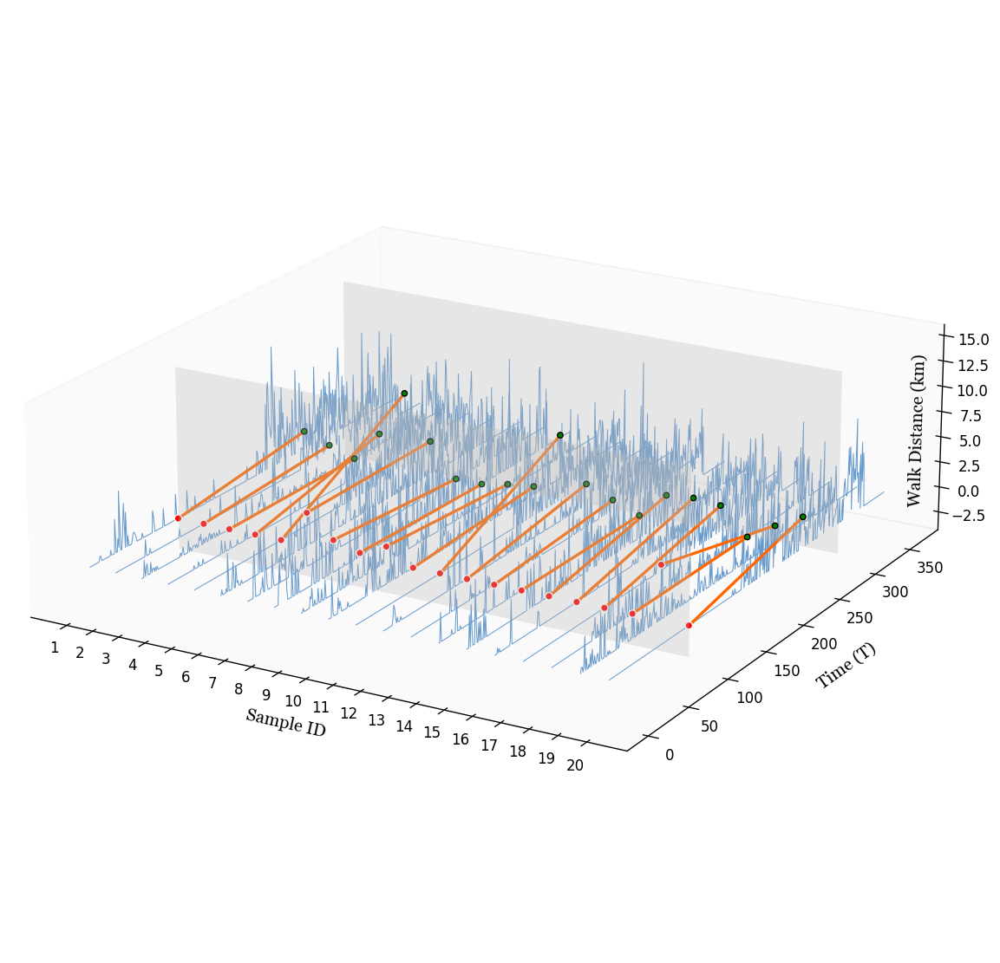

In [124]:
fig = plt.figure(figsize=(20, 12), dpi=120)
ax = plt.axes(projection='3d')

# # 设置每个平面的背景颜色
ax.xaxis.pane.fill = True
ax.yaxis.pane.fill = True
ax.zaxis.pane.fill = True
light_gray = (0.97, 0.97, 0.97, 1.0) # 极淡的灰色
ax.xaxis.pane.set_facecolor(light_gray) # 设置X平面的颜色
ax.yaxis.pane.set_facecolor(light_gray) # 设置Y平面的颜色
ax.zaxis.pane.set_facecolor(light_gray) # 设置Z平面的颜色

walk_data_select['walk_dist_km'] = walk_data_select['walk_dist']/1000
for sample_id in walk_data_select['id'].unique():
    sample_data = walk_data_select[walk_data_select['id'] == sample_id]
    xline = sample_data['id']
    yline = sample_data['T']
    zline = sample_data['walk_dist_km']

    ax.plot3D(xline, yline, zline, linewidth=0.6, color='#6699cc')

# 绘制一个垂直面（Y=某个常数）
y_loc = 100; n_samples = 20
X = np.linspace(min(walk_data_select['id']), max(walk_data_select['id']), n_samples)
Z = np.linspace(min(walk_data_select['walk_dist_km'])-3, max(walk_data_select['walk_dist_km']), n_samples)
X, Z = np.meshgrid(X, Z)
Y1 = np.full_like(X, y_loc)  # YLOC是Y的一个常数值
Y2 = np.full_like(X, y_loc+200)
ax.plot_surface(X, Y1, Z, alpha=0.3, rstride=100, cstride=100, color='#D0D0D0')
ax.plot_surface(X, Y2, Z, alpha=0.3, rstride=100, cstride=100, color='#D0D0D0')

# 添加平面上的点
point_insurface = walk_data_select[(walk_data_select['T'] == y_loc)|(walk_data_select['T'] == y_loc+150)]
point_insurface1 = walk_data_select[walk_data_select['T'] == y_loc]
point_insurface2 = walk_data_select[walk_data_select['T'] == y_loc+150]
ax.scatter3D(point_insurface1['id'], point_insurface1['T']-0.5, point_insurface1['walk_dist_km'], c='red', edgecolors='white', linewidth=0.8, s=25, alpha=1)
ax.scatter3D(point_insurface2['id'], point_insurface2['T']-0.5, point_insurface2['walk_dist_km'], c='green', edgecolors='black', linewidth=0.8, s=15, alpha=1)
for sample_id in walk_data_select['id'].unique():
    sample_data = point_insurface[point_insurface['id'] == sample_id]
    xline = sample_data['id']
    yline = sample_data['T']
    zline = sample_data['walk_dist_km']

    ax.plot3D(xline, yline, zline, linewidth=2, color='#FF6600')

# 设置轴的宽高比，以拉宽X轴
ax.set_box_aspect([3, 3, 1])
ax.view_init(elev=20)  # elev是仰角, azim是方位角
ax.grid(False)
# 设置轴标签
font_properties = {'family': 'Georgia', 'size': 12}
ax.set_xlabel('Sample ID', labelpad=10, fontdict=font_properties)
ax.set_xticks(range(1,21))
ax.set_ylabel('Time (T)', labelpad=10, fontdict=font_properties)
ax.set_zlabel('Walk Distance (km)',labelpad=-30, fontdict=font_properties)

C:\Users\huangnx\AppData\Local\Temp\ipykernel_72036\3350931730.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  walk_data_select['walk_dist_km'] = walk_data_select['walk_dist']/1000


Text(0.5, 0, 'Walk Distance (km)')

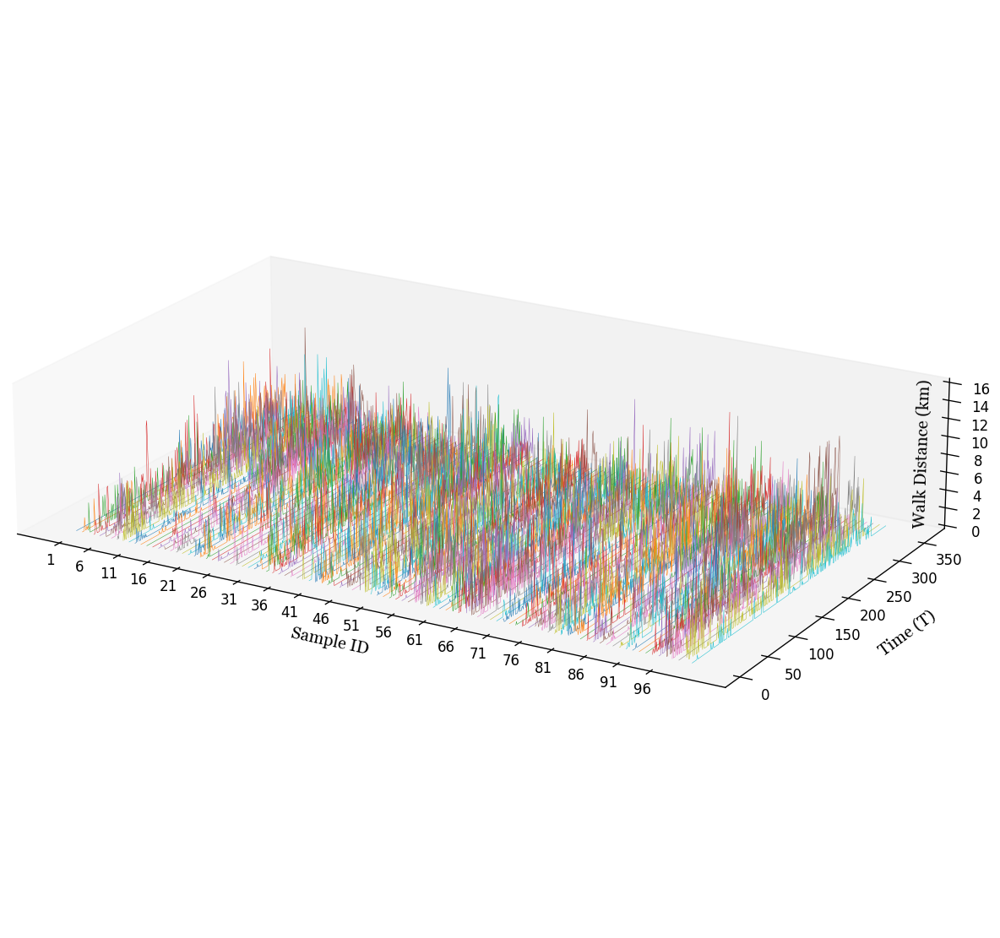

In [321]:
fig = plt.figure(figsize=(20, 12), dpi=120)
ax = plt.axes(projection='3d')

# # 设置每个平面的背景颜色
# ax.xaxis.pane.fill = True
# ax.yaxis.pane.fill = True
# ax.zaxis.pane.fill = True
# light_gray = (0.97, 0.97, 0.97, 1.0) # 极淡的灰色
# ax.xaxis.pane.set_facecolor(light_gray) # 设置X平面的颜色
# ax.yaxis.pane.set_facecolor(light_gray) # 设置Y平面的颜色
# ax.zaxis.pane.set_facecolor(light_gray) # 设置Z平面的颜色

walk_data_select['walk_dist_km'] = walk_data_select['walk_dist']/1000
for sample_id in walk_data_select['id'].unique():
    sample_data = walk_data_select[walk_data_select['id'] == sample_id]
    xline = sample_data['id']
    yline = sample_data['T']
    zline = sample_data['walk_dist_km']

    #ax.plot3D(xline, yline, zline, linewidth=0.6, color='#3366ff')
    ax.plot3D(xline, yline, zline, linewidth=0.3)

# 设置轴的宽高比，以拉宽X轴
ax.set_box_aspect([5, 3, 1])
ax.view_init(elev=20)  # elev是仰角, azim是方位角
ax.grid(False)
# 设置轴标签
font_properties = {'family': 'Georgia', 'size': 12}
ax.set_xlabel('Sample ID', labelpad=15, fontdict=font_properties)
ax.set_xticks(range(1,101,5))
ax.set_ylabel('Time (T)', labelpad=10, fontdict=font_properties)
ax.set_zlabel('Walk Distance (km)',labelpad=-30, fontdict=font_properties)

# 空间分布差异图（利用预测结果）

In [3]:
import geopandas as gpd
sz_taz = gpd.read_file('D:/317研究组/4 居住自选择/data/深圳TAZ/taz分组+加权度.shp')
#sz_taz = sz_taz.to_crs(epsg=4326)
sz_taz.head()

,AREA,ZONE,SECT6,SECT45,TAZ,ID,NAME,SNAME,POP2010,roadlength,...,group_12,taz_12__15,F2,F3,F4,covidwd,reducecovi,postwd,reducepost,geometry
0,11.693782,781,6,40,434,7810,LG204-T2,坪地,12913,0.0,...,11.0,434.0,5040.0,1649.0,3354.0,3391,0.672817,1686,0.334524,"POLYGON ((114.32804 22.81155, 114.32855 22.811..."
1,17.359354,775,6,40,428,7750,LG204-T1,坪地,19536,0.0,...,11.0,428.0,3374.0,819.0,1996.0,2555,0.757261,1378,0.408417,"POLYGON ((114.31754 22.78675, 114.31315 22.783..."
2,2.900947,780,6,40,433,7800,LG204-05,坪地,3956,0.0,...,11.0,433.0,6154.0,1807.0,3460.0,4347,0.706370,2694,0.437764,"POLYGON ((114.32804 22.81155, 114.32804 22.811..."
3,1.602727,307,3,13,99,3070,NS001-04-01,南山,67562,0.0,...,7.0,99.0,38127.0,6721.0,18408.0,31406,0.823721,19719,0.517193,"POLYGON ((113.91855 22.52711, 113.91692 22.520..."
4,1.436485,306,3,13,98,3060,NS001-04-01,南山,32215,0.0,...,9.0,98.0,39182.0,4562.0,14123.0,34620,0.883569,25059,0.639554,"POLYGON ((113.91106 22.51503, 113.91409 22.518..."


In [6]:
len(sz_taz['ID'].unique())

491

In [8]:
len(sz_taz)

491

In [4]:
path = "D:/317研究组/4 居住自选择/data/final_data/all_data/resident_info.csv"
resi_info = pd.read_csv(path)
grid = pd.read_csv('D:/317研究组/4 居住自选择/data/ss_city_grid/grid/ss_city_grid_by_cover.csv')
resi_info = pd.merge(resi_info,grid,on='fnid', how='left')
resi_info.head()

,who,date,fnid,group_id,move_dist,work_dist,chess_x,chess_y,wkt
0,68388056,20190101,38219,1,0.000000,5.280573,20,107,"MULTIPOLYGON (((113.79796639 22.68450745,113.8..."
1,68229702,20191101,20076,2,8.657041,15.100863,84,56,"MULTIPOLYGON (((113.9541479 22.57149362,113.95..."
2,68176269,20190701,23959,2,10.720544,20.660520,40,67,"MULTIPOLYGON (((113.84677311 22.59586915,113.8..."
3,67686406,20190601,36512,2,7.318999,NaN,98,102,"MULTIPOLYGON (((113.98831261 22.67342766,113.9..."
4,67656950,20190501,30376,1,0.000000,1.767251,31,85,"MULTIPOLYGON (((113.82481009 22.63575638,113.8..."


In [5]:
# 选择搬家后的数据，并根据who和group_id去重
resi_info_after = resi_info[resi_info['group_id'] == 2]
resi_info_after = resi_info_after.drop_duplicates(subset=['who','group_id']).sort_values(by='who').reset_index(drop=True)

# 转化为geodataframe
from shapely import wkt
resi_info_after['wkt'] = resi_info_after['wkt'].apply(wkt.loads)
crs = {'init':'epsg:4326'}
resi_info_after_gpd = gpd.GeoDataFrame(resi_info_after,crs=crs,geometry=resi_info_after.wkt)
resi_info_after_gpd

C:\Users\huangnx\AppData\Roaming\Python\Python39\site-packages\pyproj\crs\crs.py:130: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\huangnx\AppData\Roaming\Python\Python39\site-packages\pandas\core\dtypes\inference.py:391: ShapelyDeprecationWarning: Iteration over multi-part geometries is deprecated and will be removed in Shapely 2.0. Use the `geoms` property to access the constituent parts of a multi-part geometry.
  iter(obj)  # Can iterate over it.
C:\Users\huangnx\AppData\Roaming\Python\Python39\site-packages\pandas\core\dtypes\inference.py:392: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property inste

,who,date,fnid,group_id,move_dist,work_dist,chess_x,chess_y,wkt,geometry
0,6717,20190901,27534,2,3.749011,10.663049,45,77,"(POLYGON ((113.85897479 22.61802872, 113.86141...","MULTIPOLYGON (((113.85897 22.61803, 113.86142 ..."
1,9226,20190901,23304,2,12.050801,NaN,99,65,"(POLYGON ((113.99075294 22.59143723, 113.99319...","MULTIPOLYGON (((113.99075 22.59144, 113.99319 ..."
2,9856,20190801,43409,2,37.859237,37.874362,212,121,"(POLYGON ((114.26651092 22.71553085, 114.26895...","MULTIPOLYGON (((114.26651 22.71553, 114.26895 ..."
3,10560,20191201,22640,2,4.049598,3.922363,149,63,"(POLYGON ((114.11276975 22.58700532, 114.11521...","MULTIPOLYGON (((114.11277 22.58701, 114.11521 ..."
4,11694,20190701,27976,2,19.421310,3.628848,130,78,"(POLYGON ((114.06640336 22.62024468, 114.06884...","MULTIPOLYGON (((114.06640 22.62024, 114.06884 ..."
...,...,...,...,...,...,...,...,...,...,...
21284,78956153,20190801,50002,2,9.458020,NaN,22,140,"(POLYGON ((113.80284706 22.75763404, 113.80528...","MULTIPOLYGON (((113.80285 22.75763, 113.80529 ..."
21285,78957666,20190701,29738,2,6.730387,13.053928,107,83,"(POLYGON ((114.01027563 22.63132447, 114.01271...","MULTIPOLYGON (((114.01028 22.63132, 114.01272 ..."
21286,78963571,20191101,11489,2,7.948031,NaN,65,32,"(POLYGON ((113.90778151 22.51831064, 113.91022...","MULTIPOLYGON (((113.90778 22.51831, 113.91022 ..."
21287,78964879,20191101,45770,2,22.419229,NaN,74,128,"(POLYGON ((113.92974454 22.73104255, 113.93218...","MULTIPOLYGON (((113.92974 22.73104, 113.93218 ..."


In [9]:
# 通过判断resi_info_after的wkt是否在sz_district的geometry中，来判断属于哪个街道，添加街道列
resi_info_after['taz_id'] = None
for i in range(len(resi_info_after)):
    for j in range(len(sz_taz)):
        if resi_info_after_gpd['geometry'][i].intersects(sz_taz['geometry'][j]):
            resi_info_after['taz_id'][i] = sz_taz['ID'][j]
            break

C:\Users\huangnx\AppData\Local\Temp\ipykernel_76376\3035758472.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  resi_info_after['taz_id'][i] = sz_taz['ID'][j]
C:\Users\huangnx\AppData\Local\Temp\ipykernel_76376\3035758472.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  resi_info_after['taz_id'][i] = sz_taz['ID'][j]
C:\Users\huangnx\AppData\Local\Temp\ipykernel_76376\3035758472.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  

In [10]:
resi_info_after['taz_id'].isnull().sum()

0

In [143]:
# walk_data_before = walk_data[walk_data['T']<walk_data['move_time']]
# walk_data_after = walk_data[walk_data['T']>=walk_data['move_time']]
# # 按照who分组，计算每个who的walk_dist的均值
# walk_dist_before = walk_data_before.groupby('who').agg(avg_before=('walk_dist','mean')).reset_index()
# walk_dist_after = walk_data_after.groupby('who').agg(avg_after=('walk_dist','mean')).reset_index()
#
# # 合并walk_dist_before和walk_dist_after
# walk_dist = pd.merge(walk_dist_before,walk_dist_after,on='who',how='left')

In [11]:
# 导入预测数据
predict_data = pd.read_csv("D:/317研究组/4 居住自选择/data/final_data/all_data/predict_data.csv")

In [13]:
# 添加taz_id指标
predict_data = pd.merge(predict_data,resi_info_after[['who','taz_id']],on='who',how='left')

In [14]:
predict_data.to_csv("D:/317研究组/4 居住自选择/data/final_data/all_data/predict_data.csv",index=False)

In [15]:
predict_data.head()

,who,T,move,P,holiday,storm,density,landusemix,road_density,intersections,...,age,gender,walk_dist,chain_complexity,metro_dist_ratio,move_time,walk_dist_pred,chain_complexity_pred,subway100_pred,taz_id
0,6717,150,0,0,0,0,0.330448,0.768967,0.344449,0.221250,...,6.607608,0,0.0,4.0,0.0,151,89.367977,1.821975,17.165635,5210
1,6717,151,1,1,0,0,0.270537,0.624397,0.351494,0.089732,...,6.607608,0,0.0,3.0,0.0,151,90.504897,1.787029,17.339653,5210
2,6717,365,1,215,0,0,0.270537,0.624397,0.351494,0.089732,...,6.607608,0,0.0,2.0,0.0,151,149.668053,1.614330,18.148741,5210
3,9226,193,0,0,0,0,0.570216,0.731605,0.247463,0.175000,...,6.607608,0,0.0,8.0,0.0,194,105.206622,1.898359,16.207341,3420
4,9226,194,1,1,0,0,0.060704,0.778914,0.284694,0.196875,...,6.607608,0,500.0,8.0,0.0,194,113.880347,1.808229,16.995625,3420


In [153]:
# 按照街道分组计算标准化变化
def calculate_standardized_change(group):
    # overrall_mean = group[['avg_before','avg_after']].mean().mean()
    overall_std = group[['avg_before','avg_after']].stack().std()
    group['std_change'] = (group['avg_after']-group['avg_before'])/overall_std
    results = {
        'overall_std_change': group['std_change'].mean(),
        'max_std_change': group['std_change'].max(),
        'min_std_change' : group['std_change'].min()}
    return pd.Series(results)

walk_dist_std_change = walk_dist.groupby('district').apply(calculate_standardized_change).reset_index()
#walk_dist_std_change.rename(columns={0:'std_change'},inplace=True)
walk_dist_std_change

,district,overall_std_change,max_std_change,min_std_change
0,东晓街道,-0.056602,2.432279,-1.833871
1,东湖街道,-0.944335,0.596007,-2.376327
2,东门街道,-0.031042,4.875118,-3.739149
3,光明街道,0.326696,3.191509,-2.336182
4,公明街道,0.189273,5.020512,-3.624954
...,...,...,...,...
66,黄贝街道,-0.278939,2.934438,-5.937656
67,龙华街道,0.040615,9.750976,-3.777928
68,龙城街道,0.034408,7.682176,-4.163495
69,龙岗街道,0.061172,4.219727,-6.581029


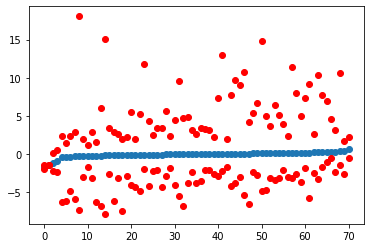

In [155]:
# 将std_change从小到大排序，并绘图
walk_dist_std_change = walk_dist_std_change.sort_values(by='overall_std_change')
walk_dist_std_change['rank'] = range(len(walk_dist_std_change))
import matplotlib.pyplot as plt
plt.scatter(walk_dist_std_change['rank'],walk_dist_std_change['overall_std_change'])
plt.scatter(walk_dist_std_change['rank'],walk_dist_std_change['max_std_change'],c='red')
plt.scatter(walk_dist_std_change['rank'],walk_dist_std_change['min_std_change'],c='red')

# 结果可视化

In [174]:
walk_data_mean = walk_data.groupby('T').agg(avg_walk_dist=('walk_dist','mean')).reset_index()
walk_data_mean.head()

,T,avg_walk_dist
0,1,116.508916
1,2,106.584736
2,3,104.623519
3,4,116.302282
4,5,114.926425


In [310]:
# 构建一个数组，截距和斜率外生给定
import os
intercept = 15.203
slope = 0.015
upper_slope = 0.016
lower_slope = 0.014
T = np.arange(1, 366)
base_I = 0.539
base_P = -0.003
base_line = intercept + slope*T
move_time = 125

# 迁居干预量
TI_after = np.arange(1, 366-move_time)
line_after = base_line[move_time] + base_I + (slope+base_P)*TI_after

# 设定置信区间
T_after = T[move_time:]
ci_upper = intercept + upper_slope * T_after
ci_lower = intercept + lower_slope * T_after

# 指定建成环境效应
# I = [0, 64.768/10, -92.729/10, 0, 0, -22.108/10, -29.160/10]
# P = [-0.157/10, 0, 0.386/10, 0.188/10, -0.388/10, 0.112/10, 0]
# I = [0, 0, 0, -0.036, -0.176, 0.101, 0]
# P = [0, -0.001, 0.001, 0.001, -0.001, 0, -0.001]
I = [10.8, -5.9, 7.3, 4.7, -2.4, 17.7, 3]
P = [0.04, -0.026, 0.015, 0.014, 0.064, 0.041, 0.012]
color_list = [[203/255, 180/255, 123/255], [91/255, 183/255, 205/255], [250/255, 118/255, 74/255],[84/255, 172/255, 117/255], [197/255, 86/255, 89/255], [117/255, 114/255, 181/255], [3/255, 67/255, 139/255]]
be_varis = ['density','landusemix', 'road_density', 'center', 'work', 'subway', 'bus']
file_name = [f"{name}.png" for name in be_varis]

base_path = "D:/317研究组/4 居住自选择/img/its_result/地铁占比/"

for i in range(len(I)):
    fig, ax = plt.subplots(figsize=(16,8),dpi=200)
    # 绘制迁居点
    ax.axvline(x = move_time, color = 'r', label = 'intervention')
    ax.axvspan(0, move_time, facecolor='#B0A483', alpha=0.03)
    ax.axvspan(move_time, 370, facecolor='#A8E4A0', alpha=0.03)


    for j in range(len(I)):
        ax.plot(T_after, base_line[move_time] + base_I + I[j] + (slope+base_P+P[j])*TI_after, color='#6E6E6E', linewidth=1.5, alpha=0.2)
    # ax.plot(T_after, base_line[move_time] + base_I + I[0] + (slope+base_P+P[0])*TI_after, color=[203/255, 180/255, 123/255], linewidth=4, label=be_varis[0])
    # ax.plot(T_after, base_line[move_time] + base_I + I[1] + (slope+base_P+P[1])*TI_after, color=[91/255, 183/255, 205/255], linewidth=4, label=be_varis[1])
    # ax.plot(T_after, base_line[move_time] + base_I + I[2] + (slope+base_P+P[2])*TI_after, color=[250/255, 118/255, 74/255], linewidth=4, label=be_varis[2])
    # ax.plot(T_after, base_line[move_time] + base_I + I[3] + (slope+base_P+P[3])*TI_after, color=[84/255, 172/255, 117/255], linewidth=4, label=be_varis[3])
    # ax.plot(T_after, base_line[move_time] + base_I + I[4] + (slope+base_P+P[4])*TI_after, color=[197/255, 86/255, 89/255], linewidth=4, label=be_varis[4])
    # ax.plot(T_after, base_line[move_time] + base_I + I[5] + (slope+base_P+P[5])*TI_after, color=[117/255, 114/255, 181/255], linewidth=4, label=be_varis[5])
    # ax.plot(T_after, base_line[move_time] + base_I + I[6] + (slope+base_P+P[6])*TI_after, color=[3/255, 67/255, 139/255], linewidth=4, label=be_varis[6])
    ax.plot(T[:move_time],base_line[:move_time],color='k',linewidth=3, label="baseline")
    ax.plot(T[move_time:],line_after,color='k',linewidth=3)
    # 绘制迁居后反事实
    ax.plot(T[move_time:], base_line[move_time:], color='#4A4A4A', ls='dotted', linewidth=3, alpha=0.5, label="counterfactual")
    ax.fill_between(T_after, ci_upper, ci_lower, color='k', alpha=0.07, label="counterfactual 95% CI")

    # 绘制高亮的建成环境效应
    ax.plot(T_after, base_line[move_time] + base_I + I[i] + (slope+base_P+P[i])*TI_after, color=color_list[i], linewidth=4, label=be_varis[i])

    ax.set_xlim([0,370])
    ax.set_ylim([0,60])
    font_properties = {'family': 'Georgia', 'size': 14}
    ax.set_xlabel('Time (T)', fontdict=font_properties)
    ax.set_ylabel('Share of metro transit use (%)', fontdict=font_properties)
    font_properties1 = {'family': 'Georgia', 'size': 12}
    ax.legend(loc='upper left', prop=font_properties1)

    # 构建完整路径
    full_path = os.path.join(base_path, file_name[i])
    plt.savefig(full_path, dpi=200)
    plt.close(fig)


In [297]:
color_list = [[203/255, 180/255, 123/255], [91/255, 183/255, 205/255], [250/255, 118/255, 74/255],[84/255, 172/255, 117/255], [197/255, 86/255, 89/255], [117/255, 114/255, 181/255], [3/255, 67/255, 139/255]]
color_list[i]

[0.011764705882352941, 0.2627450980392157, 0.5450980392156862]

In [305]:
file_name = [f"{name}.png" for name in be_varis]
file_name

['density.png',
 'landusemix.png',
 'road_density.png',
 'center.png',
 'work.png',
 'subway.png',
 'bus.png']

In [256]:
base_line[move_time:]

array([ 89.146,  89.197,  89.248,  89.299,  89.35 ,  89.401,  89.452,
        89.503,  89.554,  89.605,  89.656,  89.707,  89.758,  89.809,
        89.86 ,  89.911,  89.962,  90.013,  90.064,  90.115,  90.166,
        90.217,  90.268,  90.319,  90.37 ,  90.421,  90.472,  90.523,
        90.574,  90.625,  90.676,  90.727,  90.778,  90.829,  90.88 ,
        90.931,  90.982,  91.033,  91.084,  91.135,  91.186,  91.237,
        91.288,  91.339,  91.39 ,  91.441,  91.492,  91.543,  91.594,
        91.645,  91.696,  91.747,  91.798,  91.849,  91.9  ,  91.951,
        92.002,  92.053,  92.104,  92.155,  92.206,  92.257,  92.308,
        92.359,  92.41 ,  92.461,  92.512,  92.563,  92.614,  92.665,
        92.716,  92.767,  92.818,  92.869,  92.92 ,  92.971,  93.022,
        93.073,  93.124,  93.175,  93.226,  93.277,  93.328,  93.379,
        93.43 ,  93.481,  93.532,  93.583,  93.634,  93.685,  93.736,
        93.787,  93.838,  93.889,  93.94 ,  93.991,  94.042,  94.093,
        94.144,  94.

In [257]:
base_line[move_time:] + (slope+base_P)*TI_after

array([ 89.143,  89.191,  89.239,  89.287,  89.335,  89.383,  89.431,
        89.479,  89.527,  89.575,  89.623,  89.671,  89.719,  89.767,
        89.815,  89.863,  89.911,  89.959,  90.007,  90.055,  90.103,
        90.151,  90.199,  90.247,  90.295,  90.343,  90.391,  90.439,
        90.487,  90.535,  90.583,  90.631,  90.679,  90.727,  90.775,
        90.823,  90.871,  90.919,  90.967,  91.015,  91.063,  91.111,
        91.159,  91.207,  91.255,  91.303,  91.351,  91.399,  91.447,
        91.495,  91.543,  91.591,  91.639,  91.687,  91.735,  91.783,
        91.831,  91.879,  91.927,  91.975,  92.023,  92.071,  92.119,
        92.167,  92.215,  92.263,  92.311,  92.359,  92.407,  92.455,
        92.503,  92.551,  92.599,  92.647,  92.695,  92.743,  92.791,
        92.839,  92.887,  92.935,  92.983,  93.031,  93.079,  93.127,
        93.175,  93.223,  93.271,  93.319,  93.367,  93.415,  93.463,
        93.511,  93.559,  93.607,  93.655,  93.703,  93.751,  93.799,
        93.847,  93.

# 敏感性分析

In [26]:
sensitivity = pd.read_excel('D:/317研究组/4 居住自选择/result/sensitivity analysis.xlsx')
sensitivity.head()

,type,variable,coeff,ratio,model,significant
0,move,landusemix,64.768,1.00,walk_dist,1
1,move,landusemix,65.599,0.05,walk_dist,1
2,move,landusemix,71.455,0.15,walk_dist,1
3,move,landusemix,9.475,0.25,walk_dist,0
4,move,landusemix,63.100,0.35,walk_dist,1


In [27]:
# 划分数据
final_result1 = sensitivity[(sensitivity['ratio']==1) & (sensitivity['model']=='walk_dist')]
progress_result1 = sensitivity[(sensitivity['ratio']<1) & (sensitivity['model']=='walk_dist')]
final_result2 = sensitivity[(sensitivity['ratio']==1) & (sensitivity['model']=='chain_complexity')]
progress_result2 = sensitivity[(sensitivity['ratio']<1) & (sensitivity['model']=='chain_complexity')]
final_result3 = sensitivity[(sensitivity['ratio']==1) & (sensitivity['model']=='subway_use')]
progress_result3 = sensitivity[(sensitivity['ratio']<1) & (sensitivity['model']=='subway_use')]

C:\Users\huangnx\AppData\Local\Temp\ipykernel_67036\3941653723.py:1: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


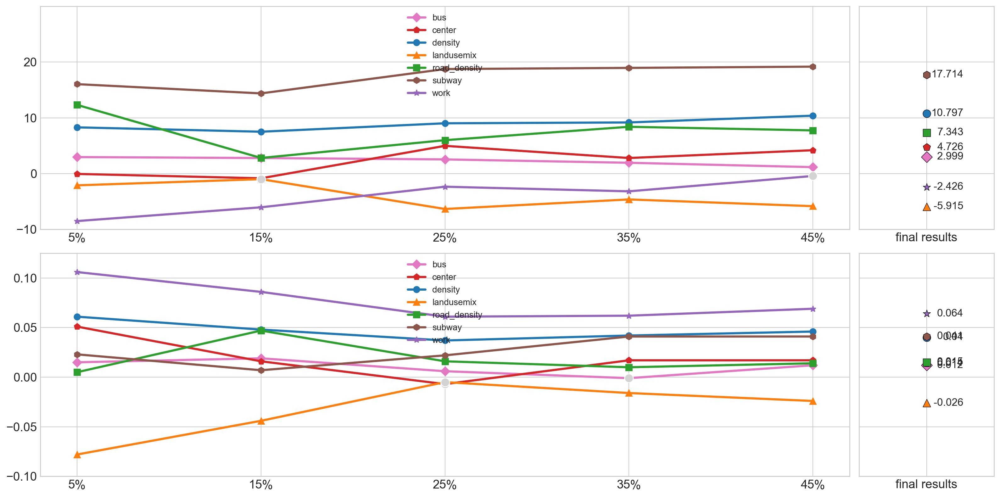

In [90]:
plt.style.use('seaborn-whitegrid')
fig, ax = plt.subplots(2,2,figsize=(16,8),dpi=200, gridspec_kw={'width_ratios': [6, 1]}, sharey='row')
# 获取当前的颜色循环
prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

# 创建一个标签到颜色的映射
labels = ['density', 'landusemix', 'road_density', 'center', 'work', 'subway', 'bus']
marker = ['o','^','s','p','*','h','D']
label_color_dict = dict(zip(labels, colors))
label_marker_dict = dict(zip(labels, marker))

# 根据type和variable分组绘图
def plot_sensitive(group):
    # 定义不显著点
    no_sig = group[group['significant']==0]
    group.reset_index(drop=True, inplace=True)
    if group['type'].values[0] == 'move':
        ax[0,0].plot(group['ratio'], group['coeff'], label=group['variable'].values[0], color=label_color_dict[group['variable'].values[0]], linewidth=2.5, marker=label_marker_dict[group['variable'].values[0]], markersize=7, zorder=1)
        ax[0,0].scatter(no_sig['ratio'], no_sig['coeff'], color='#D3D3D3', edgecolors='white', s=100, zorder=2)
    else:
        ax[1,0].plot(group['ratio'], group['coeff'], label=group['variable'].values[0], color=label_color_dict[group['variable'].values[0]], linewidth=2.5, marker=label_marker_dict[group['variable'].values[0]], markersize=7, zorder=1)
        ax[1,0].scatter(no_sig['ratio'], no_sig['coeff'], color='#D3D3D3', edgecolors='white', s=100, zorder=2)

def plot_result(group):
    if group['type'].values[0] == 'move':
        ax[0,1].scatter(np.zeros(len(group)), group['coeff'], label=group['variable'].values[0], color=label_color_dict[group['variable'].values[0]], s=80, edgecolors='k', linewidth=0.5, marker=label_marker_dict[group['variable'].values[0]])
        for i in range(len(group)):
            ax[0,1].text(0.03, group.iloc[i]['coeff'], str(group.iloc[i]['coeff']), fontsize=12, ha='right', va='center')
    else:
        ax[1,1].scatter(np.zeros(len(group)), group['coeff'], label=group['variable'].values[0], color=label_color_dict[group['variable'].values[0]],  s=80, edgecolors='k',linewidth=0.5, marker=label_marker_dict[group['variable'].values[0]])
        for i in range(len(group)):
            ax[1,1].text(0.03, group.iloc[i]['coeff'], str(group.iloc[i]['coeff']), fontsize=12, ha='right', va='center')

# 绘制过程结果
progress_result3.groupby(['type','variable']).apply(plot_sensitive)
# 绘制最终结果
final_result3.groupby(['type','variable']).apply(plot_result)
ax[0,0].set_ylim([-10,30])
ax[0,0].set_yticks(np.arange(-10, 30, 10))
ax[0,0].set_xticks(np.arange(0.05, 0.55, 0.1))
ax[0,0].set_xticklabels(['5%','15%','25%','35%','45%'])
ax[0,0].tick_params(axis='x', labelsize=14)  # 设置 x 轴刻度标签的字体大小为 12
ax[0,0].tick_params(axis='y', labelsize=14)
ax[0,0].legend(loc='upper center')

ax[1,0].set_ylim([-0.1,0.125])
ax[1,0].set_yticks(np.arange(-0.1,0.125, 0.05))
ax[1,0].set_xticks(np.arange(0.05, 0.55, 0.1))
ax[1,0].set_xticklabels(['5%','15%','25%','35%','45%'])
ax[1,0].tick_params(axis='x', labelsize=14)  # 设置 x 轴刻度标签的字体大小为 12
ax[1,0].tick_params(axis='y', labelsize=14)
ax[1,0].legend(loc='upper center')

ax[0,1].set_xticks([0])
ax[0,1].set_xticklabels(['final results'], fontsize=14)
ax[1,1].set_xticks([0])
ax[1,1].set_xticklabels(['final results'], fontsize=14)

plt.subplots_adjust(wspace=0.2)
plt.tight_layout()

In [28]:


# 显示创建的映射字典
print(label_color_dict)

{'density': '#1f77b4', 'landusemix': '#ff7f0e', 'road_density': '#2ca02c', 'center': '#d62728', 'work': '#9467bd', 'subway': '#8c564b', 'bus': '#e377c2'}


In [12]:
for key, grp in final_result1.groupby(['type','variable']):
    print(grp)

   type variable  coeff  ratio      model  significant
36    P   center  0.188    1.0  walk_dist            1
   type variable  coeff  ratio      model  significant
24    P  density -0.157    1.0  walk_dist            1
   type      variable  coeff  ratio      model  significant
30    P  road_density  0.386    1.0  walk_dist            1
   type variable  coeff  ratio      model  significant
48    P   subway  0.112    1.0  walk_dist            1
   type   variable  coeff  ratio      model  significant
42    P  work_dist -0.388    1.0  walk_dist            1
    type variable  coeff  ratio      model  significant
18  move      bus -29.16    1.0  walk_dist            1
   type    variable   coeff  ratio      model  significant
0  move  landusemix  64.768    1.0  walk_dist            1
   type      variable   coeff  ratio      model  significant
6  move  road_density -92.729    1.0  walk_dist            1
    type variable   coeff  ratio      model  significant
12  move   subway -22.108  